# Object Detection and Text Extraction

## Tools and Techniques
For this project, we do not have any training data to use for specific purpose and we need to rely on open available datasets like PASCAL VOC, COCO. Thus, our strategy will be to use pretrained weight using transfer learning.
Using libraries like Keras, Pytorch will increase overhead, so better option will be to use imageai library.

In [1]:
from warnings import filterwarnings
filterwarnings('ignore')

from pytesseract import image_to_string
import numpy
from imageai.Detection import ObjectDetection
from PIL import Image, ImageEnhance, ImageFilter, ImageChops
import pytesseract
import matplotlib.pyplot as plt
from matplotlib import patches, patheffects
import os
import re
import numpy as np
import scipy
import cv2
import pandas as pd
from pathlib import Path
from tqdm import tqdm

%matplotlib inline

Using TensorFlow backend.


### Define functions useful for plotting graphs

In [2]:
def show_img(im, figsize=None, ax=None):
    if not ax: fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(im)
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    return ax

def draw_outline(o, lw):
    o.set_path_effects([patheffects.Stroke(
        linewidth=lw, foreground='black'), patheffects.Normal()])

def draw_rect(ax, b):
    patch = ax.add_patch(patches.Rectangle(b[:2], *b[-2], fill=False, edgecolor='white', lw=2))
    draw_outline(patch, 4)
    
def draw_text(ax, xy, txt, sz=14):
    text = ax.text(*xy, txt, verticalalignment='top', color='white', fontsize=sz, weight='bold')
    draw_outline(text, 1)

#### Path of images and weights

In [3]:
PATH = Path('../../darknet/')
weights = list(filter(lambda x: 'h5' in str(x), list(PATH.iterdir())))
weights

[PosixPath('../../darknet/resnet50_coco_best_v2.0.1.h5'),
 PosixPath('../../darknet/yolo.h5')]

In [4]:
images = [i for i in os.listdir('test_data/') if re.match(r'\d+.*\.(jpg|png)', i)]
images[:3]

['15.jpg', '12.jpg', '8.png']

## One stage or two stage
There are two common strategies to resolve the class imbalance between a small number of image regions with an object relative to many background regions. Two-stage detectors use region proposals to filter out background regions. One stage detectors perform direct classification without proposals.

One stage detectors like YOLO, SSD are usually much faster than two stage detectors (YOLO is 10 times faster than faster RCNN) but also a bit inaccurate (10-40%).

In [5]:
detector = ObjectDetection()
custom_objects = detector.CustomObjects(clock=True, cake=True, cell_phone=True, person=True, bottle=True, keyboard=True, chair=True, vase=True, suitcase=True, handbag=True, cup=True)

### For YOLOv3
Let's check YOLO first

In [6]:
detector = ObjectDetection()
detector.setModelTypeAsYOLOv3()
detector.setModelPath(weights[1])
detector.loadModel()

In [7]:
fig, axes = plt.subplots(15, 2, figsize=(50,400))
for i, image in tqdm(enumerate(images)):
    detections = detector.detectCustomObjectsFromImage(custom_objects=custom_objects,
                                                       input_image='test_data/'+image,
                                                       output_image_path=f'detected/yolo/detected_{image}')
    show_img(plt.imread('test_data/'+image), ax=axes[i,0])
    show_img(plt.imread(f'detected/yolo/detected_{image}'), ax=axes[i,1])

15it [00:31,  2.13s/it]


It's understanding most of the images well. Let's see if we can get anything better by using Retinanet.

One-stage detectors that are applied over a regular, dense sampling of possible object locations have the potential to be faster and simpler, but have trailed the accuracy of two-stage detectors because of extreme class imbalance encountered during training.

For handling this, Retinanet uses Focal loss. It is the reshaping of cross entropy loss such that it down-weights the loss assigned to well-classified examples. The novel focal loss focuses training on a sparse set of hard examples and prevents the vast number of easy negatives from overwhelming the detector during training.

### For RetinaNet

In [8]:
detector = ObjectDetection()
detector.setModelTypeAsRetinaNet()
detector.setModelPath(weights[0])
detector.loadModel()

In [9]:
fig, axes = plt.subplots(15, 2, figsize=(50,400))
for i, image in tqdm(enumerate(images)):
    detections = detector.detectCustomObjectsFromImage(custom_objects=custom_objects, 
                                                       input_image='test_data/'+image,
                                                       output_image_path=f'detected/retinanet/detected_{image}')
    show_img(plt.imread('test_data/'+image), ax=axes[i,0])
    show_img(plt.imread(f'detected/retinanet/detected_{image}'), ax=axes[i,1])

15it [02:00,  8.04s/it]


Retinanet is giving good confident score and as well as classifying objects like "Vase". But also taking lot more time than YOLO as we can see YOLO took only 2s/it while retinanet took 8s/it.

## Text Extraction
Our model have detected some images like keyboard correctly but still it misclassified some. Let's see if we can do something with text extraction.

Now, we have two choices either to extract text from whole image or from detected subimages. Using small size detected subimage will be less computational expensive but model have left text part in some detected images like it detected only cup in LAVAZZA ESPRESSO example. Thus, we will be using whole image.

#### Functions useful for extracting text

In [10]:
def extract_text(path):
    # Preprocess the image befor OCR
    tif_file = preprocess_image_using_opencv(path)
    # Perform OCR using tesseract-ocr library
    image = Image.open(tif_file)
    ocr_text = image_to_string(image, config="-psm 6")
    alphanumeric_text = ''.join(e for e in ocr_text)

    return alphanumeric_text

def binarize_image_using_opencv(captcha_path, binary_image_path='input-black-n-white.jpg'):
    img = cv2.imread(captcha_path)
    im_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    (thresh, im_bw) = cv2.threshold(im_gray, 128, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    # although thresh is used below, gonna pick something suitable
    im_bw = cv2.threshold(im_gray, thresh, 255, cv2.THRESH_BINARY)[1]
    cv2.imwrite(binary_image_path, im_bw)
    return binary_image_path


def preprocess_image_using_opencv(captcha_path):
    bin_image_path = binarize_image_using_opencv(captcha_path)

    im_bin = Image.open(bin_image_path)
    
    basewidth = 340  # in pixels
    wpercent = (basewidth/float(im_bin.size[0]))
    hsize = int((float(im_bin.size[1])*float(wpercent)))
    big = im_bin.resize((basewidth, hsize), Image.NEAREST)
    
    # tesseract-ocr only works with TIF so save the bigger image in that format
    ext = ".tif"
    tif_file = "input-NEAREST.tif"
    big.save(tif_file)

    return tif_file

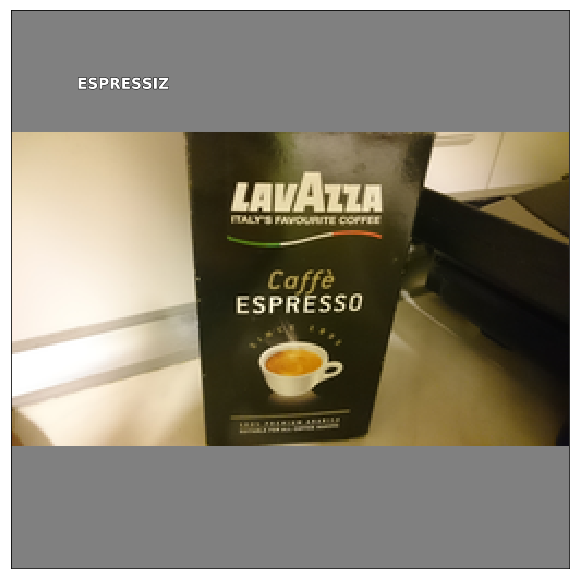

In [11]:
extracted_texts = extract_text('test_data/7.png').split('\n')
extracted_text = list(filter(lambda x: x.isalpha(), extracted_texts))[1]
ax = show_img(im = plt.imread('test_data/7.png'), figsize=(10,20))
draw_text(ax, (30,30), extracted_text, sz = 15)

Our extractor extracted 'Espressiz' from image but this is slighly incorrect. Let's use google spellcheck to correct this.

In [12]:
!python2 ../../../commands/google-spellcheck.py 'espressiz amazon'

espresso amazon


Google spellcheck have corrected word for us .. Now we can use this word to scrape e-commerce sites to compare prices.

We can also extract traits like color of object in image using k-means clustering but I can't see its benefits in searching product on e-commerce sites.

## End